In [2]:
import pandas as pd

In [3]:
import os
import json

def parse_json_files(root_folder):
    data = []

    for root, dirs, files in os.walk(root_folder):
        for file in files:
            if file.endswith('.json'):
                file_path = os.path.join(root, file)
                with open(file_path, 'r', encoding='utf-8') as f:
                    try:
                        json_data = json.load(f)
                        data.append(json_data)
                    except json.JSONDecodeError as e:
                        print(f"Error decoding JSON from file {file_path}: {e}")
                    except UnicodeDecodeError as e:
                        print(f"Error decoding file {file_path}: {e}")

    return data

root_folder = 'C:\\Users\\andre\\Documents\\Personal\\ISI\\sem3\\SRI\\fake_news_identification\\TagTogFakeRom\\ann.json\\master\\pool'
parsed_data = parse_json_files(root_folder)

print(parsed_data)


[{'annotatable': {'parts': ['s1v1']}, 'anncomplete': True, 'sources': [{'name': 'hotnews.ro', 'id': None, 'url': 'https://m.hotnews.ro/stire/24150322'}], 'metas': {'m_1': {'value': 'VIDEO Klaus Iohannis pledează pentru solidaritate transatlantică, la recepția ambasadei SUA cu ocazia Zilei Independenței', 'confidence': {'state': 'pre-added', 'who': ['user:stefanruseti'], 'prob': 1}}, 'm_2': {'value': '02/07/2020', 'confidence': {'state': 'pre-added', 'who': ['user:stefanruseti'], 'prob': 1}}, 'm_3': {'value': 'https://m.hotnews.ro/stire/24150322', 'confidence': {'state': 'pre-added', 'who': ['user:stefanruseti'], 'prob': 1}}, 'm_5': {'value': 'Știri reale', 'confidence': {'state': 'pre-added', 'who': ['user:Denisa'], 'prob': 1}}}, 'entities': [], 'relations': []}, {'annotatable': {'parts': ['s1v1']}, 'anncomplete': True, 'sources': [{'name': 'hotnews.ro', 'id': None, 'url': 'https://m.hotnews.ro/stire/24908339'}], 'metas': {'m_1': {'value': 'Mediastandard.ro: Algoritmul YouTube recomand

In [32]:
parsed_data[0]['metas']

{'m_1': {'value': 'VIDEO Klaus Iohannis pledează pentru solidaritate transatlantică, la recepția ambasadei SUA cu ocazia Zilei Independenței',
  'confidence': {'state': 'pre-added',
   'who': ['user:stefanruseti'],
   'prob': 1}},
 'm_2': {'value': '02/07/2020',
  'confidence': {'state': 'pre-added',
   'who': ['user:stefanruseti'],
   'prob': 1}},
 'm_3': {'value': 'https://m.hotnews.ro/stire/24150322',
  'confidence': {'state': 'pre-added',
   'who': ['user:stefanruseti'],
   'prob': 1}},
 'm_5': {'value': 'Știri reale',
  'confidence': {'state': 'pre-added', 'who': ['user:Denisa'], 'prob': 1}}}

In [28]:
def filter_data(parsed_data):
    filtered_data = []
    for item in parsed_data:
        metas = item.get('metas', {})
        m_1_value = metas.get('m_1', {}).get('value')
        m_5_value = metas.get('m_5', {}).get('value')
        if m_1_value is not None and m_5_value is not None:
            filtered_data.append({'m_1_value': m_1_value, 'm_5_value': m_5_value})
    return filtered_data


In [36]:
filtered_data[540]

{'m_1_value': 'Dictatura COVID și Poligonul de încercare România',
 'm_5_value': 'Știri propagandistice'}

In [29]:
filtered_data = filter_data(parsed_data)

# Create a DataFrame from the filtered data
df = pd.DataFrame(filtered_data)

print(df)


                                             m_1_value         m_5_value
0    VIDEO Klaus Iohannis pledează pentru solidarit...       Știri reale
1    Mediastandard.ro: Algoritmul YouTube recomandă...       Știri reale
2    Săteni din Bolivia au distrus antene de teleco...       Știri reale
3    Sfârșitul republicii automobilistice germane? ...  Știri plauzibile
4    Coronavirus: Amânarea summitului UE-China prog...       Știri reale
..                                                 ...               ...
744  Patriarhia se implică în campania de vaccinare...       Știri reale
745         FOTO Kylian Mbappe s-a vaccinat anti-Covid       Știri reale
746  DSP Bacău, despre cazul femeii de 73 de ani ca...       Știri reale
747  Valneva a anunțat lansarea unui studiu clinic ...       Știri reale
748  Kremlinul dă vina pe "nihilism" pentru noul va...       Știri reale

[749 rows x 2 columns]


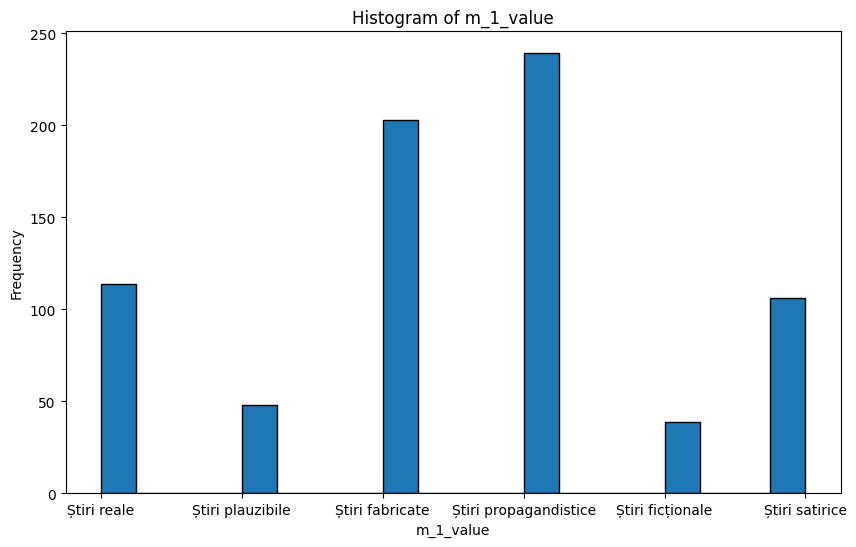

In [30]:
import matplotlib.pyplot as plt

# Plotting the histogram
plt.figure(figsize=(10, 6))
plt.hist(df['m_5_value'], bins=20, edgecolor='black')
plt.xlabel('m_1_value')
plt.ylabel('Frequency')
plt.title('Histogram of m_1_value')
plt.show()


In [37]:
df.rename(columns={'m_1_value': 'title', 'm_5_value': 'label'}, inplace=True)

In [40]:
# Mapping dictionary
mapping = {'Știri reale': 'real', 'Știri plauzibile': 'real', 'Știri fabricate': 'fake', 'Știri propagandistice': 'fake', 'Știri ficționale': 'fake', 'Știri satirice': 'fake'}

# Replace values using map
df['label'] = df['label'].map(mapping)


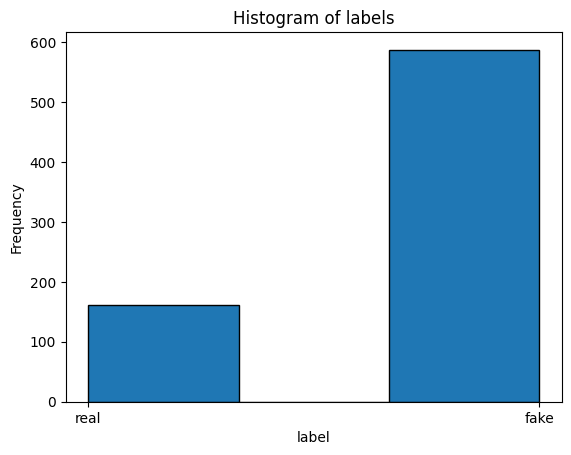

In [47]:
# Plotting the histogram
plt.hist(df['label'], bins=3, edgecolor='black')
plt.xlabel('label')
plt.ylabel('Frequency')
plt.title('Histogram of labels')
plt.show()


In [48]:
df.to_csv('labeled_news_dataset.csv', index=False)

In [ ]:
import faiss
import torch
from transformers import AutoTokenizer, AutoModel

# Load pre-trained model and tokenizer
model_name = 'sentence-transformers/all-MiniLM-L6-v2'
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModel.from_pretrained(model_name)

def embed_texts(texts):
    inputs = tokenizer(texts, padding=True, truncation=True, return_tensors='pt')
    with torch.no_grad():
        embeddings = model(**inputs).last_hidden_state.mean(dim=1)
    return embeddings.numpy()

# Example sentence and paragraphs
sentence = "Dictatura COVID și Poligonul de încercare România"
paragraphs = [
    "First paragraph text.",
    "Second paragraph text.",
    "Third paragraph text.",
    # Add more paragraphs as needed
]

# Create embeddings
sentence_embedding = embed_texts([sentence])
paragraph_embeddings = embed_texts(paragraphs)

# Index the paragraph embeddings
index = faiss.IndexFlatL2(paragraph_embeddings.shape[1])
index.add(paragraph_embeddings)

# Search for the most similar paragraphs
k = 3  # Number of most similar paragraphs to retrieve
distances, indices = index.search(sentence_embedding, k)

# Print the most similar paragraphs
for i in range(k):
    print(f"Paragraph {indices[0][i]}: {paragraphs[indices[0][i]]} (Distance: {distances[0][i]})")


# 3. Reddit

In [ ]:
import praw
from prawcore.exceptions import BadRequest

In [ ]:
# Initialize PRAW with your credentials
reddit = praw.Reddit(
    client_id='YoIz-ZP727cRluai3x7i8Q',
    client_secret='GEBRHcmLzAn_EW6lehK9YxzOppRD_w',
    user_agent='script:covid_fake_news_app:v0.0.1'
)

In [47]:
def search_top_n_posts(subreddit_name, search_term, posts_limit = 3):
    try:
        # Query the subreddit for the top 100 posts containing the search term
        subreddit = reddit.subreddit(subreddit_name)
        top_posts = subreddit.search(query=search_term, limit=posts_limit, sort='top')

        # Organize the data into a list of JSON objects
        posts_data_list = []
        for post in top_posts:
            post_data = {
                'title': post.title,
                'text': post.selftext,
                'comments': []
            }
            
            # Fetch the top 3 comments
            post.comments.replace_more(limit=0)
            top_comments = post.comments.list()[:3]
            
            for comment in top_comments:
                comment_data = {
                    'comment': comment.body,
                    'replies': [reply.body for reply in comment.replies]
                }
                post_data['comments'].append(comment_data)
            
            posts_data_list.append(post_data)
            
    except BadRequest as e:
        print(f"BadRequest error: {e}")
    except Exception as e:
        print(f"An error occurred: {e}")

    return posts_data_list

In [48]:
# Define the subreddit and the search term
subreddit_name = 'Romania'
search_term = 'COVID'
posts_data_list = search_top_n_posts(subreddit_name, search_term, posts_limit = 3)


In [33]:
import json
import os
from whoosh import index
from whoosh.fields import Schema, TEXT, ID
from whoosh.analysis import StemmingAnalyzer

# Define the schema
schema = Schema(
    title=TEXT(stored=True, analyzer=StemmingAnalyzer()),
    text=TEXT(stored=True, analyzer=StemmingAnalyzer()),
    comments=TEXT(stored=True, analyzer=StemmingAnalyzer()),
    replies=TEXT(stored=True, analyzer=StemmingAnalyzer())
)

# Create the index directory if it doesn't exist
if not os.path.exists("indexdir"):
    os.mkdir("indexdir")

# Create the index
ix = index.create_in("indexdir", schema)

In [34]:
# Function to flatten JSON objects
def flatten_json(obj):
    flat_content = f"{obj['title']} {obj['text']}"
    for comment in obj.get('comments', []):
        flat_content += f" {comment}"
        for reply in comment.get('replies', []):
            flat_content += f" {reply}"
    return flat_content

In [35]:
# Function to index JSON objects
def index_json_objects(json_objects):
    writer = ix.writer()
    for obj in json_objects:
        flat_content = flatten_json(obj)
        writer.add_document(title=obj['title'], text=obj['text'], comments=flat_content)
    writer.commit()

In [36]:
index_json_objects(posts_data_list)

In [45]:
from whoosh.qparser import QueryParser

# Function to search the index
def search_index(query_str):
    with ix.searcher() as searcher:
        query = QueryParser("title", ix.schema).parse(query_str)
        results = searcher.search(query, limit=2)
        for result in results:
            print(f"Title: {result['title']}")
            print(f"Text: {result['text']}")
            print(f"Comments and Replies: {result['comments']}\n")


In [46]:
# Example query
search_query = 'Kylian Mbappe s-a vaccinat anti-Covid'
search_index(search_query)

Title: Covid-19 memes de duminică
Text: 
Comments and Replies: Covid-19 memes de duminică  {'comment': '- cunoașteți pe cineva cu covid? Eu nu stiu pe nimeni\n\nEu stiu pe cineva\n\n- experientele personale nu se pun, nu-i adevărat, minți', 'replies': ['Șah mat ateiștilor!', '>- cunoașteți pe cineva cu covid? Eu nu stiu pe nimeni\n\n\nÎntreabă-l, din toate cunoștințele care nu au covid, câte au fost testate.']} Șah mat ateiștilor! >- cunoașteți pe cineva cu covid? Eu nu stiu pe nimeni


Întreabă-l, din toate cunoștințele care nu au covid, câte au fost testate. {'comment': 'The 9 horsemen of the apocalypse', 'replies': ['Aprostcalipsa']} Aprostcalipsa {'comment': 'Nici eu nu am văzut cu ochii mei pe nimeni să moară în accident de mașină, sau de infarct, sau de anevrism. Deci ergo și prin urmare nu să există așa ceva.', 'replies': ['N am vazut pe nimeni sa moara', 'Auzi la el "ergo" se scrie "ego" boss /s', 'Condu o ora prin București..... o sa crezi în accidente de mașină sigur. Pentru 